In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
#warnings.simplefilter(action='ignore')

#Butun kolon ve satirlari gormek icin
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#virgulden sonra gösterilecek olan sayı 2 basamak olarak ayarlanıyor.
#pd.set_option('display.float_format', lambda x: '%.2f' % x)
#pd.options.display.float_format = '{:,.2f}'.format


# Import required libraries
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

In [13]:
clipboard = pd.read_clipboard()
clipboard.to_csv('clipboard.csv')
clipboard

,0,Year,Year
0,1,Quarter,Quarter
1,2,Month,Month
2,3,DayofMonth,Day of Month
3,4,DayOfWeek,Day of Week (numeric)
4,5,FlightDate,Date of Flight
5,6,Reporting_Airline,Airline Unique Carrier Code
6,7,DOT_ID_Reporting_Airline,Number assigned by US DOT to identify a unique...
7,8,IATA_CODE_Reporting_Airline,Airline Code assigned by IATA
8,9,Tail_Number,Aircraft tail number
9,10,Flight_Number_Reporting_Airline,Flight Number


# Read Data

In [16]:
df_airline = pd.read_csv('airline_2m.csv', nrows=3000,
                        encoding = "ISO-8859-1",
                            dtype={'Div1Airport': str, 'Div1TailNum': str, 
                                   'Div2Airport': str, 'Div2TailNum': str})
df_airline.head()

,Year,Quarter,Month,DayofMonth,DayOfWeek,FlightDate,Reporting_Airline,DOT_ID_Reporting_Airline,IATA_CODE_Reporting_Airline,Tail_Number,Flight_Number_Reporting_Airline,OriginAirportID,OriginAirportSeqID,OriginCityMarketID,Origin,OriginCityName,OriginState,OriginStateFips,OriginStateName,OriginWac,DestAirportID,DestAirportSeqID,DestCityMarketID,Dest,DestCityName,DestState,DestStateFips,DestStateName,DestWac,CRSDepTime,DepTime,DepDelay,DepDelayMinutes,DepDel15,DepartureDelayGroups,DepTimeBlk,TaxiOut,WheelsOff,WheelsOn,TaxiIn,CRSArrTime,ArrTime,ArrDelay,ArrDelayMinutes,ArrDel15,ArrivalDelayGroups,ArrTimeBlk,Cancelled,CancellationCode,Diverted,CRSElapsedTime,ActualElapsedTime,AirTime,Flights,Distance,DistanceGroup,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,FirstDepTime,TotalAddGTime,LongestAddGTime,DivAirportLandings,DivReachedDest,DivActualElapsedTime,DivArrDelay,DivDistance,Div1Airport,Div1AirportID,Div1AirportSeqID,Div1WheelsOn,Div1TotalGTime,Div1LongestGTime,Div1WheelsOff,Div1TailNum,Div2Airport,Div2AirportID,Div2AirportSeqID,Div2WheelsOn,Div2TotalGTime,Div2LongestGTime,Div2WheelsOff,Div2TailNum,Div3Airport,Div3AirportID,Div3AirportSeqID,Div3WheelsOn,Div3TotalGTime,Div3LongestGTime,Div3WheelsOff,Div3TailNum,Div4Airport,Div4AirportID,Div4AirportSeqID,Div4WheelsOn,Div4TotalGTime,Div4LongestGTime,Div4WheelsOff,Div4TailNum,Div5Airport,Div5AirportID,Div5AirportSeqID,Div5WheelsOn,Div5TotalGTime,Div5LongestGTime,Div5WheelsOff,Div5TailNum
0,1998,1,1,2,5,1998-01-02,NW,19386,NW,N297US,675,13487,1348701,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,14869,1486902,34614,SLC,"Salt Lake City, UT",UT,49.0,Utah,87,1640,1659.0,19.0,19.0,1.0,1.0,1600-1659,24.0,1723.0,1856.0,3.0,1836,1859.0,23.0,23.0,1.0,1.0,1800-1859,0.0,NaN,0.0,176.0,180.0,153.0,1.0,991.0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2009,2,5,28,4,2009-05-28,FL,20437,FL,N946AT,671,13342,1334202,33342,MKE,"Milwaukee, WI",WI,55,Wisconsin,45,13204,1320401,31454,MCO,"Orlando, FL",FL,12.0,Florida,33,1204,1202.0,-2.0,0.0,0.0,-1.0,1200-1259,10.0,1212.0,1533.0,8.0,1541,1541.0,0.0,0.0,0.0,0.0,1500-1559,0.0,NaN,0.0,157.0,159.0,141.0,1.0,1066.0,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2013,2,6,29,6,2013-06-29,MQ,20398,MQ,N665MQ,3297,11921,1192102,31921,GJT,"Grand Junction, CO",CO,8,Colorado,82,11298,1129803,30194,DFW,"Dallas/Fort Worth, TX",TX,48.0,Texas,74,1630,1644.0,14.0,14.0,0.0,0.0,1600-1659,9.0,1653.0,1936.0,6.0,1945,1942.0,-3.0,0.0,0.0,-1.0,1900-1959,0.0,NaN,0.0,135.0,118.0,103.0,1.0,773.0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2010,3,8,31,2,2010-08-31,DL,19790,DL,N6705Y,1806,12892,1289201,32575,LAX,"Los Angeles, CA",CA,6,California,91,11433,1143301,31295,DTW,"Detroit, MI",MI,26.0,Michigan,43,1305,1305.0,0.0,0.0,0.0,0.0,1300-1359,23.0,1328.0,2008.0,7.0,2035,2015.0,-20.0,0.0,0.0,-2.0,2000-2059,0.0,NaN,0.0,270.0,250.0,220.0,1.0,1979.0,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2006,1,1,15,7,2006-01-15,US,20355,US,N504AU,465,11618,1161801,31703,EWR,"Newark, NJ",NJ,34,New Jersey,21,11057,1105702,31057,CLT,"Charlotte, NC",NC,37.0,North Carolina,36,1820,1911.0,51.0,51.0,1.0,3.0,1800-1859,19.0,1930.0,2050.0,8.0,2026,2058.0,32.0,32.0,1.0,2.0,2000-2059,0.0,NaN,0.0,126.0,107.0,80.0,1.0,529.0,3,0.0,0.0,0.0,0.0,32.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [126]:
df_airline.to_csv('df_airline_3000.csv')

In [20]:
df_airline.Distance.isna().sum()

0

In [17]:
df_airline.shape

(3000, 109)

In [21]:
data_random = df_airline.sample(n=500, random_state=42)
data_random.shape

(500, 109)

# Basic Plotly Chart

### Lab structure

#### plotly.graph_objects

1.  Review scatter plot creation

    Theme: How departure time changes with respect to airport distance

2.  **To do** - Create line plot

    Theme: Extract average monthly delay time and see how it changes over the year

#### plotly.express

1.  Review bar chart creation

    Theme: Extract number of flights from a specific airline that goes to a destination

2.  **To do** - Create bubble chart

    Theme: Get number of flights as per reporting airline

3.  **To do** - Create histogram

    Theme: Get distribution of arrival delay

4.  Review pie chart

    Theme: Proportion of distance group by month (month indicated by numbers)

5.  **To do** - Create sunburst chart

    Theme: Hierarchical view in othe order of month and destination state holding value of number of flights


## plotly.graph_objects

## Scatter Plot

In [22]:
data_random.head(2)

,Year,Quarter,Month,DayofMonth,DayOfWeek,FlightDate,Reporting_Airline,DOT_ID_Reporting_Airline,IATA_CODE_Reporting_Airline,Tail_Number,Flight_Number_Reporting_Airline,OriginAirportID,OriginAirportSeqID,OriginCityMarketID,Origin,OriginCityName,OriginState,OriginStateFips,OriginStateName,OriginWac,DestAirportID,DestAirportSeqID,DestCityMarketID,Dest,DestCityName,DestState,DestStateFips,DestStateName,DestWac,CRSDepTime,DepTime,DepDelay,DepDelayMinutes,DepDel15,DepartureDelayGroups,DepTimeBlk,TaxiOut,WheelsOff,WheelsOn,TaxiIn,CRSArrTime,ArrTime,ArrDelay,ArrDelayMinutes,ArrDel15,ArrivalDelayGroups,ArrTimeBlk,Cancelled,CancellationCode,Diverted,CRSElapsedTime,ActualElapsedTime,AirTime,Flights,Distance,DistanceGroup,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,FirstDepTime,TotalAddGTime,LongestAddGTime,DivAirportLandings,DivReachedDest,DivActualElapsedTime,DivArrDelay,DivDistance,Div1Airport,Div1AirportID,Div1AirportSeqID,Div1WheelsOn,Div1TotalGTime,Div1LongestGTime,Div1WheelsOff,Div1TailNum,Div2Airport,Div2AirportID,Div2AirportSeqID,Div2WheelsOn,Div2TotalGTime,Div2LongestGTime,Div2WheelsOff,Div2TailNum,Div3Airport,Div3AirportID,Div3AirportSeqID,Div3WheelsOn,Div3TotalGTime,Div3LongestGTime,Div3WheelsOff,Div3TailNum,Div4Airport,Div4AirportID,Div4AirportSeqID,Div4WheelsOn,Div4TotalGTime,Div4LongestGTime,Div4WheelsOff,Div4TailNum,Div5Airport,Div5AirportID,Div5AirportSeqID,Div5WheelsOn,Div5TotalGTime,Div5LongestGTime,Div5WheelsOff,Div5TailNum
1801,2005,4,12,25,7,2005-12-25,CO,19704,CO,N30401,1487,13204,1320401,31454,MCO,"Orlando, FL",FL,12,Florida,33,12266,1226602,31453,IAH,"Houston, TX",TX,48.0,Texas,74,1205,1202.0,-3.0,0.0,0.0,-1.0,1200-1259,11.0,1213.0,1326.0,7.0,1338,1333.0,-5.0,0.0,0.0,-1.0,1300-1359,0.0,NaN,0.0,153.0,151.0,133.0,1.0,853.0,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1190,2017,3,8,3,4,2017-08-03,OO,20304,OO,N924SW,5011,13930,1393004,30977,ORD,"Chicago, IL",IL,17,Illinois,41,11823,1182304,31823,FWA,"Fort Wayne, IN",IN,18.0,Indiana,42,732,727.0,-5.0,0.0,0.0,-1.0,0700-0759,22.0,749.0,923.0,5.0,935,928.0,-7.0,0.0,0.0,-1.0,0900-0959,0.0,NaN,0.0,63.0,61.0,34.0,1.0,157.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
data_random.DepTime.head()

1801    1202.0
1190     727.0
1817    1849.0
251      904.0
2505    1348.0
Name: DepTime, dtype: float64

Learn more about usage of scatter plot [here](https://plotly.com/python/line-and-scatter/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkDV0101ENSkillsNetwork20297740-2021-01-01)

#### Idea: How departure time changes with respect to airport distance

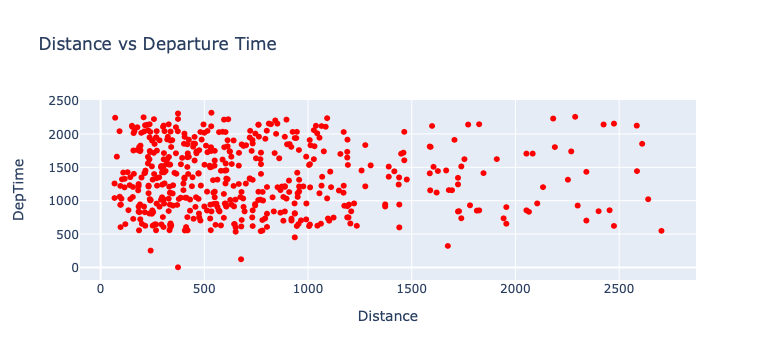

In [23]:
# First we create a figure using go.Figure and adding trace to it through go.scatter
fig=go.Figure(data=go.Scatter(x=data_random['Distance'], y=data_random['DepTime'], mode='markers', marker=dict(color='red')))

# Updating layout through `update_layout`. Here we are adding title to the plot and providing title to x and y axis.
fig.update_layout(title='Distance vs Departure Time', xaxis_title='Distance', yaxis_title='DepTime')

# Display the figure
fig.show()

## Line Plot

Learn more about line plot [here](https://plotly.com/python/line-charts/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkDV0101ENSkillsNetwork20297740-2021-01-01)

IDEA: Extract average monthly arrival delay time and see how it changes over the year.


In [43]:
line_data = data_random.groupby('Month')['ArrDelay'].mean()
line_data

Month
1     16.083333
2      0.400000
3      3.811321
4     -4.064516
5      8.342857
6     17.354167
7     12.860465
8      9.916667
9     -2.179487
10     4.543478
11     0.318182
12     2.437500
Name: ArrDelay, dtype: float64

In [44]:
# RESET_INDEX !!
line_data = data_random.groupby('Month')['ArrDelay'].mean().reset_index()
line_data

,Month,ArrDelay
0,1,16.083333
1,2,0.400000
2,3,3.811321
3,4,-4.064516
4,5,8.342857
5,6,17.354167
6,7,12.860465
7,8,9.916667
8,9,-2.179487
9,10,4.543478


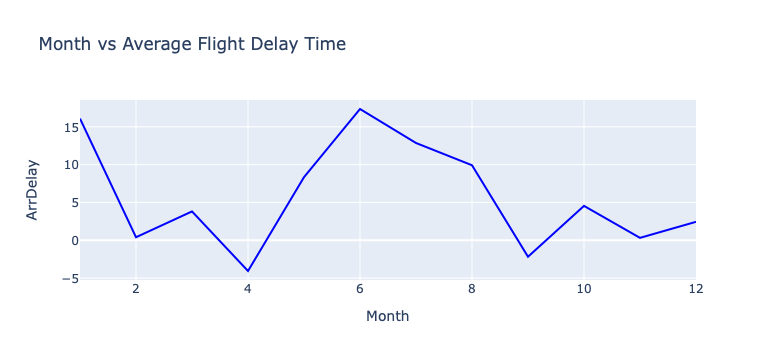

In [46]:
fig= go.Figure(data=go.Scatter(x=line_data.Month, y=line_data.ArrDelay, mode='lines', marker=dict(color='blue')))
fig.update_layout(title='Month vs Average Flight Delay Time' , xaxis_title='Month', yaxis_title='ArrDelay')
fig.show()

In [61]:
data_random[['Month','ArrDelay']].value_counts().reset_index(name='total_num').sort_values('ArrDelay').head(10)

,Month,ArrDelay,total_num
141,12,-43.0,1
282,2,-33.0,1
137,10,-30.0,1
188,10,-29.0,1
135,1,-29.0,1
234,4,-28.0,1
140,12,-28.0,1
223,3,-28.0,1
328,5,-28.0,1
281,2,-27.0,1


# plotly_express

## Bar Chart

Learn more about bar chart [here](https://plotly.com/python/bar-charts/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkDV0101ENSkillsNetwork20297740-2021-01-01)

#### Idea: Extract number of flights from a specific airline that goes to a destination


In [64]:
# Group the data by destination state and reporting airline. Compute total number of flights in each combination
bar_data = data_random.groupby(['DestState'])['Flights'].sum().reset_index()
bar_data

,DestState,Flights
0,AK,2.0
1,AL,3.0
2,AR,3.0
3,AZ,16.0
4,CA,50.0
5,CO,15.0
6,CT,5.0
7,FL,32.0
8,GA,23.0
9,HI,4.0


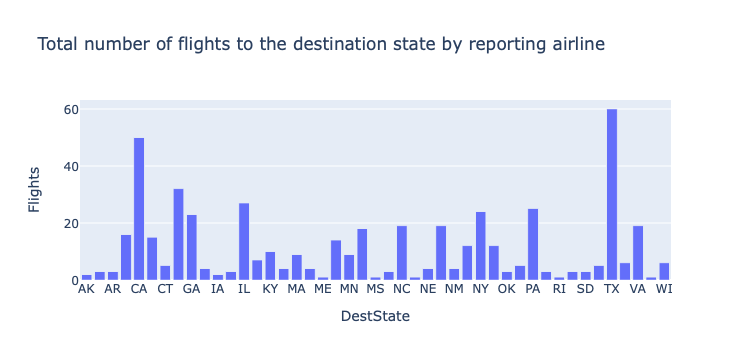

In [65]:
# Use plotly express bar chart function px.bar. Provide input data, x and y axis variable, and title of the chart.
# This will give total number of flights to the destination state.

fig = px.bar(bar_data, x='DestState', y='Flights', title='Total number of flights to the destination state by reporting airline')
fig.show()

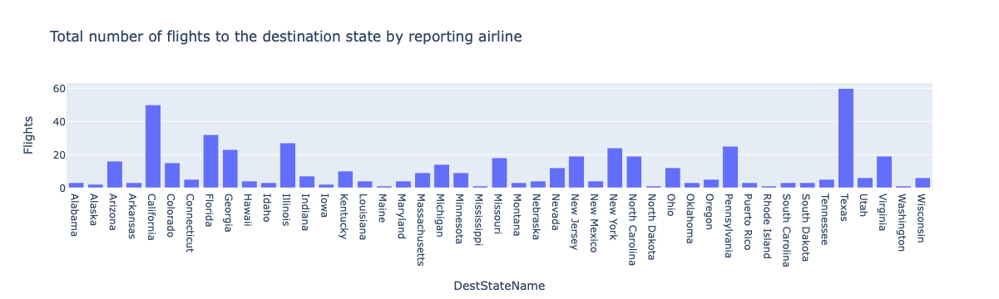

In [66]:
bar_data = data_random.groupby(['DestStateName'])['Flights'].sum().reset_index()

fig = px.bar(bar_data, x='DestStateName', y='Flights', title='Total number of flights to the destination state by reporting airline')
fig.show()

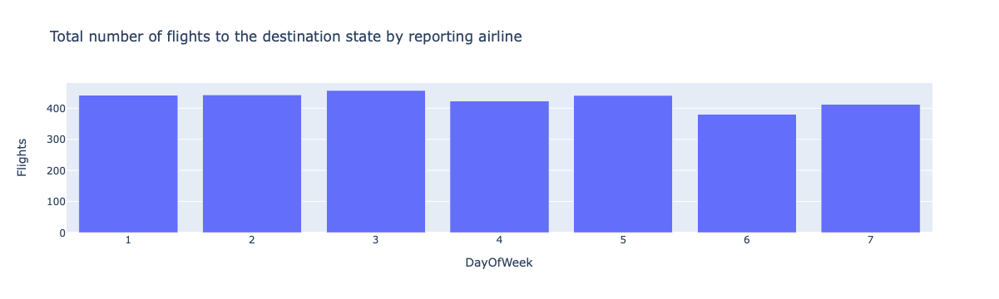

In [74]:
bar_data = df_airline.groupby(['DayOfWeek'])['Flights'].sum().reset_index()

fig = px.bar(bar_data, x='DayOfWeek', y='Flights', title='Total number of flights to the destination state by reporting WeekOfDAy')
fig.show()

## Buble Chart

Learn more about bubble chart [here](https://plotly.com/python/bubble-charts/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkDV0101ENSkillsNetwork20297740-2021-01-01)

#### Idea: Get number of flights as per reporting airline


In [75]:
bub_data = data_random.groupby(['Reporting_Airline'])['Flights'].sum().reset_index()
bub_data.head()

,Reporting_Airline,Flights
0,9E,5.0
1,AA,59.0
2,AS,3.0
3,B6,13.0
4,CO,23.0


**To do**

*   Create a bubble chart using the `bub_data` with x-axis being reporting airline and y-axis being flights.
*   Provide title to the chart
*   Update size of the bubble based on the number of flights. Use `size` parameter.
*   Update name of the hover tooltip to `reporting_airline` using `hover_name` parameter.


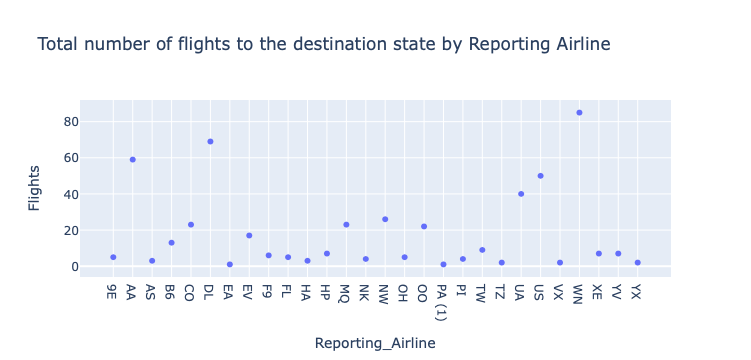

In [114]:
fig = px.scatter(bub_data, x='Reporting_Airline', y='Flights',
                 
                 hover_name='Reporting_Airline',
                 title='Total number of flights to the destination state by Reporting Airline')
fig.show()

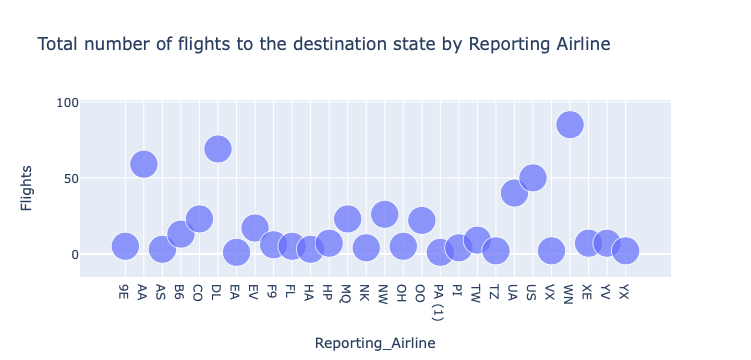

In [116]:
fig = px.scatter(bub_data, x='Reporting_Airline', y='Flights',
                 size = np.full(28, 1),
                 hover_name='Reporting_Airline',
                 title='Total number of flights to the destination state by Reporting Airline')
fig.show()

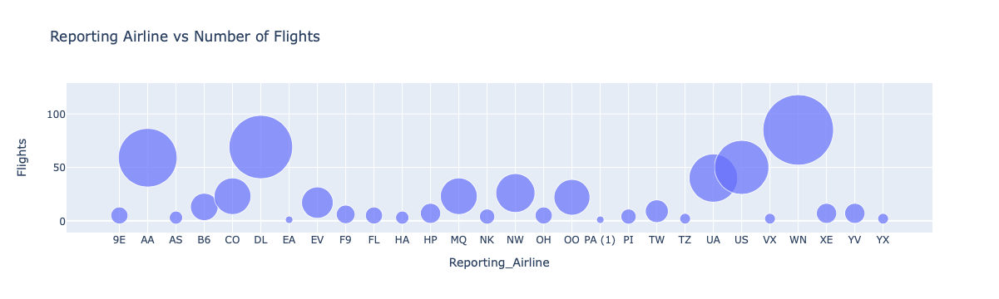

In [119]:
# Solution

fig = px.scatter(bub_data, x="Reporting_Airline", y="Flights", size="Flights",
                 hover_name="Reporting_Airline", title='Reporting Airline vs Number of Flights', size_max=60,
                 )
fig.show()

## Histogram

Learn more about histogram [here](https://plotly.com/python/histograms/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkDV0101ENSkillsNetwork20297740-2021-01-01)

#### Idea: Get distribution of arrival delay


In [121]:
# Set missing values to 0
data_random['ArrDelay'] = data_random.ArrDelay.fillna(0)

**To do**

*   Use px.histogram and pass the dataset.
*   Pass `ArrDelay` to x parameter.


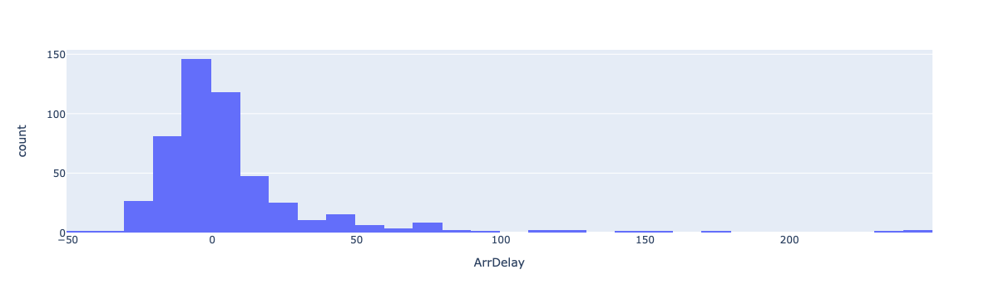

In [123]:
fig = px.histogram(data_random, x='ArrDelay')
fig.show()

## Pie Chart

Learn more about pie chart [here](https://plotly.com/python/pie-charts/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkDV0101ENSkillsNetwork20297740-2021-01-01)

#### Idea: Proportion of distance group by month (month indicated by numbers)


In [142]:
pie_data = data_random.groupby('DistanceGroup')['Month'].sum().reset_index()
pie_data

,DistanceGroup,Month
0,1,529
1,2,832
2,3,695
3,4,491
4,5,318
5,6,100
6,7,132
7,8,72
8,9,60
9,10,81


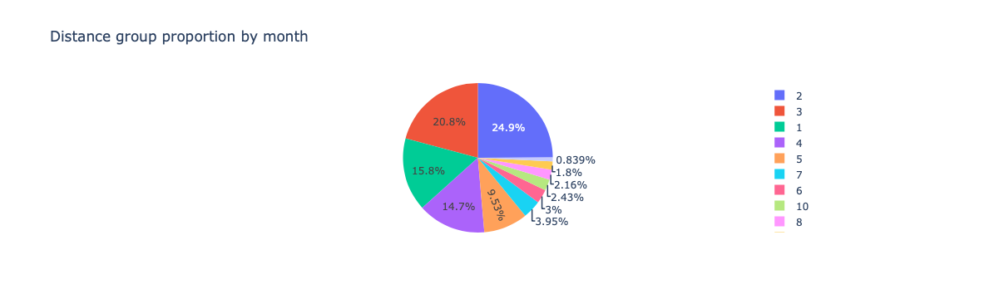

In [143]:
fig = px.pie(pie_data, values='Month', names='DistanceGroup', title= 'Distance group proportion by month')
fig.show()

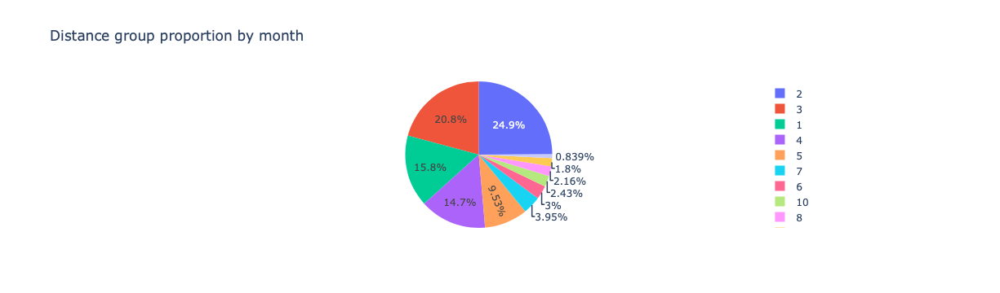

In [138]:
# Use px.pie function to create the chart. Input dataset. 
# Values parameter will set values associated to the sector. 'Month' feature is passed to it.
# labels for the sector are passed to the `names` parameter.
fig = px.pie(data_random, values='Month', names='DistanceGroup', title= 'Distance group proportion by month')
fig.show()

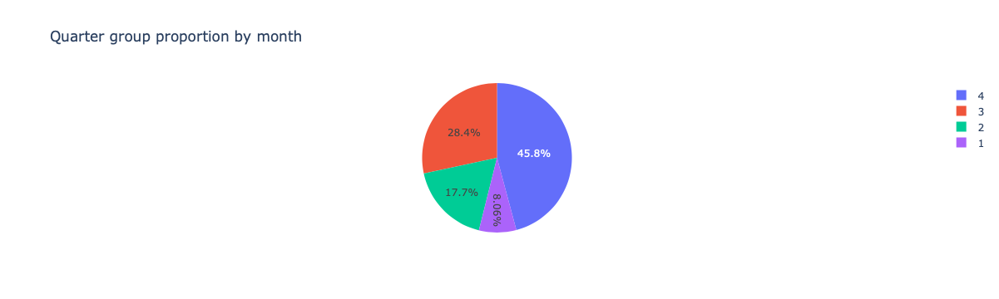

In [156]:
fig = px.pie(data_random, values='Month', names='Quarter', title= 'Quarter group proportion by month')
fig.show()

## Sunburst Charts

Learn more about sunburst chart [here](https://plotly.com/python/sunburst-charts/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkDV0101ENSkillsNetwork20297740-2021-01-01)

#### Idea: Hierarchical view in othe order of month and destination state holding value of number of flights


**To do**

*   Create sunburst chart using `px.sunburst`.
*   Define hierarchy of sectors from root to leaves in `path` parameter. Here, we go from `Month` to `DestStateName` feature.
*   Set sector values in `values` paramter. Here, we can pass in `Flights` feature.
*   Show the figure.


/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



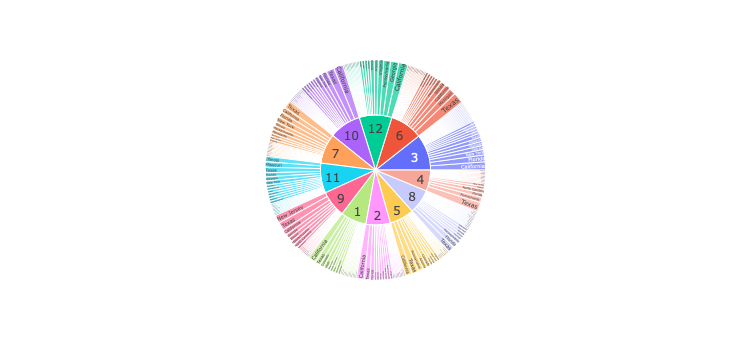

In [169]:
fig = px.sunburst(data_random,
                  values='Flights',
                  path=['Month','DestStateName'])
fig.show()

/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



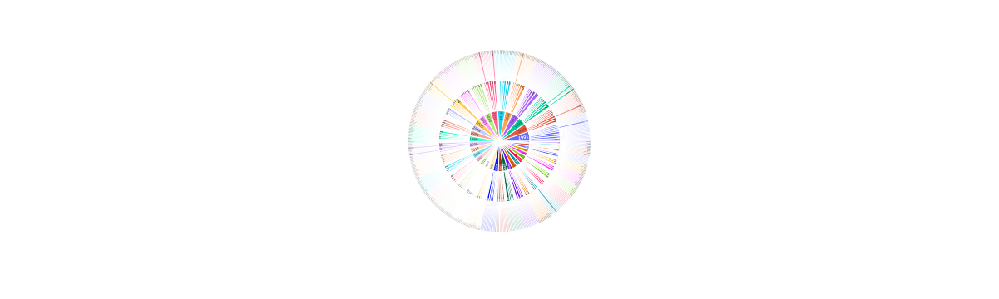

In [176]:
fig = px.sunburst(data_random,
                  values='Flights',
                  path=['Year','Month','DestStateName'])
fig.show()

In [175]:
data_random[['Year','Month', 'DestStateName','Flights']].head(15).sort_values('DestStateName')

,Year,Month,DestStateName,Flights
1411,1993,3,California,1.0
408,2009,5,California,1.0
1763,2012,10,California,1.0
1817,2014,10,Colorado,1.0
1117,2017,6,Florida,1.0
52,2011,4,Hawaii,1.0
1190,2017,8,Indiana,1.0
2113,2001,7,Missouri,1.0
644,1992,3,New Mexico,1.0
2254,2019,8,Pennsylvania,1.0


# Extras

## Scatter Plot

In [58]:
# Import required libraries
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

In [59]:
# https://plotly.com/python-api-reference/generated/plotly.data.html
df_ = px.data.gapminder()
df_.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4


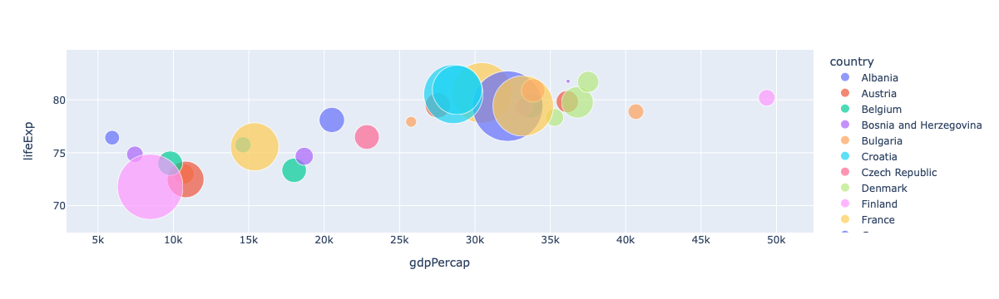

In [21]:
# https://plotly.com/python-api-reference/plotly.express.html

df = df_[(df_.continent=='Europe')&(df_.year==2007)]
fig = px.scatter(df, x='gdpPercap', y='lifeExp', size='pop', color='country',
                 size_max=60, hover_data=['iso_alpha'], hover_name='country')
fig.show()

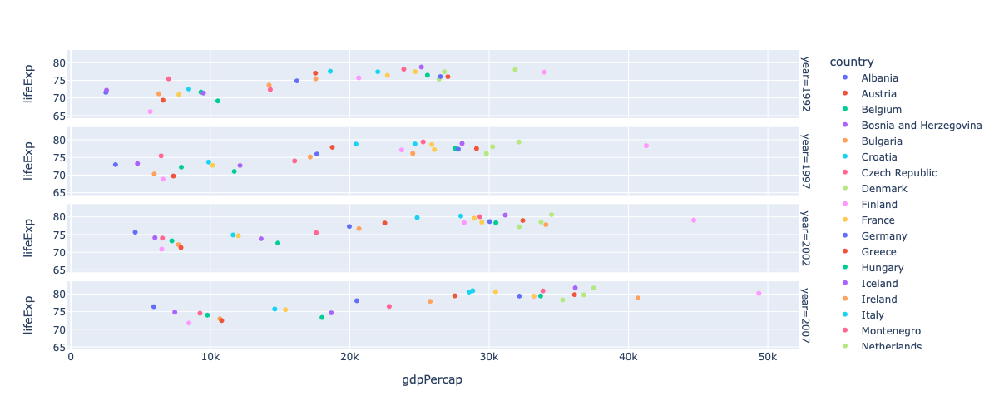

In [20]:
df = df_[df_.continent=='Europe'].query('year>1990')
fig = px.scatter(df, x="gdpPercap", y="lifeExp", color='country', facet_row='year', height=500)
fig.show()

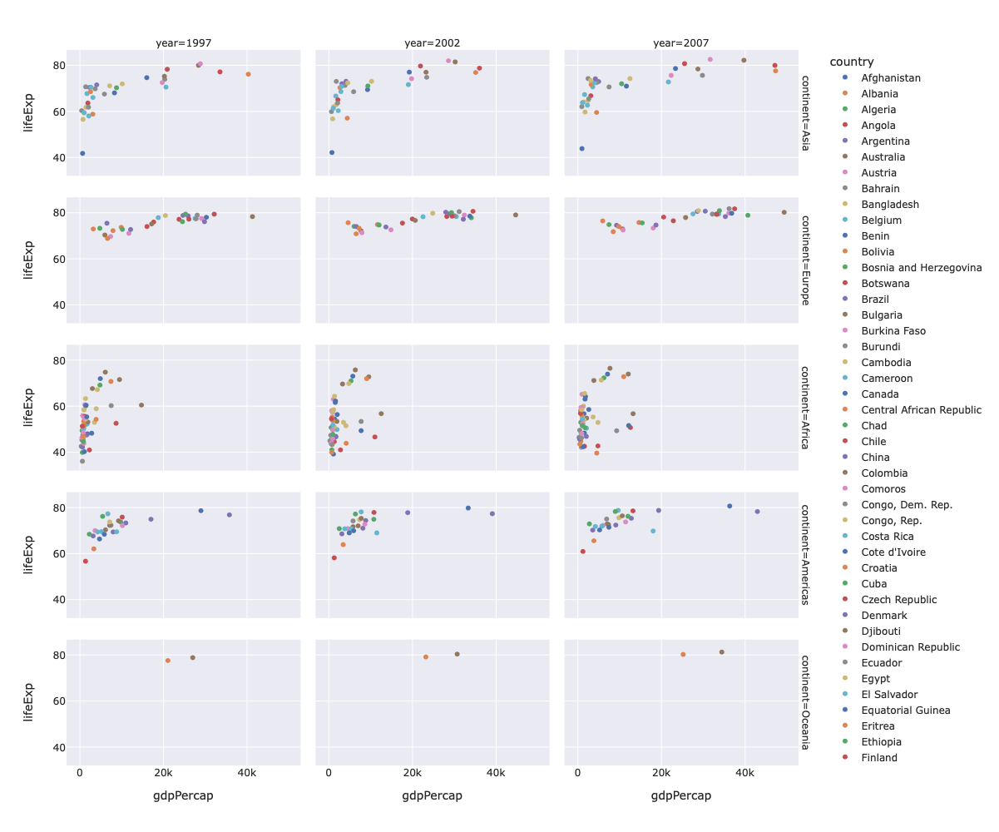

In [22]:
df = df_[df_.year>1996]
fig = px.scatter(df, x="gdpPercap", y="lifeExp", color='country', facet_row='continent', facet_col='year', height=1000,
                 template='seaborn')
fig.show()

## Line Chart

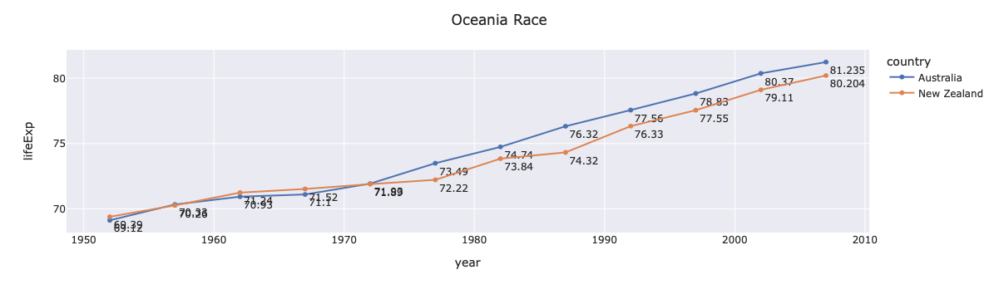

In [34]:
# https://plotly.com/python/line-charts/
df = df_[df_.continent == 'Oceania']
fig = px.line(df, x='year', y='lifeExp', color='country', text='lifeExp', template='seaborn')

# https://plotly.com/python/reference/index/
fig.update_traces(textposition='bottom right')
fig.update_layout(title='Oceania Race')
fig.show()

## Bar Chart

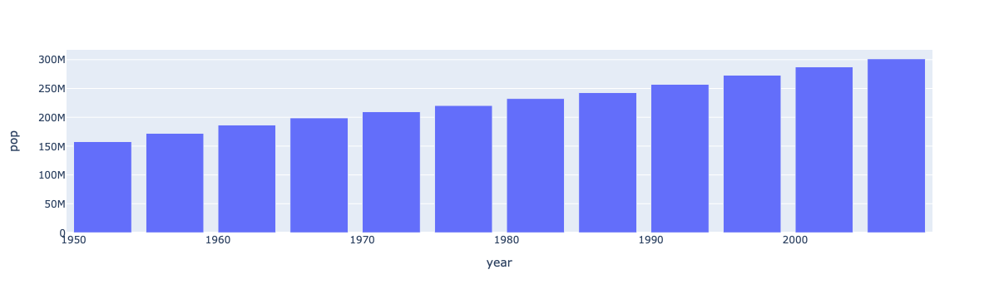

In [25]:
df = df_[df_.country=='United States']
fig = px.bar(df, x='year', y='pop')
fig.show()

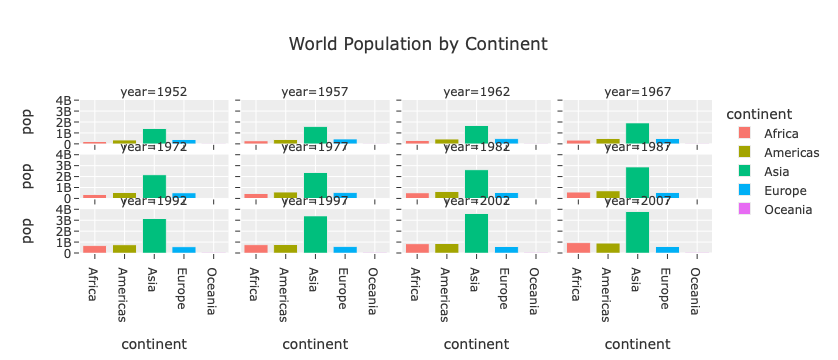

In [26]:
df = df_.groupby(['year', 'continent']).sum().reset_index()

fig = px.bar(df, x='continent', y='pop', color='continent', template='ggplot2', title='World Population by Continent',
             facet_col='year', facet_col_wrap=4)
fig.show()

## Plotly Graph Objects


####    If you want to get serious about Plotly, you will have to start using Graph Objects at some point!
####    More customization
####    Lets you create dynamic charts
####    It can be overwelming if you don't know what you want


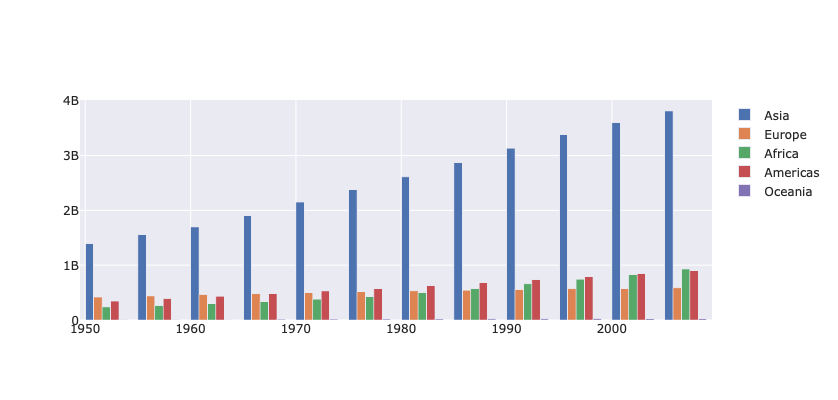

In [39]:
df = df_.groupby(['year', 'continent']).sum().reset_index()

fig = go.Figure(
    data=[
        go.Bar(name='Asia', x=df[df.continent=='Asia'].year, y=df[df.continent=='Asia']['pop']),
        go.Bar(name='Europe', x=df[df.continent=='Europe'].year, y=df[df.continent=='Europe']['pop']),
        go.Bar(name='Africa', x=df[df.continent=='Africa'].year, y=df[df.continent=='Africa']['pop']),
        go.Bar(name='Americas', x=df[df.continent=='Americas'].year, y=df[df.continent=='Americas']['pop']),
        go.Bar(name='Oceania', x=df[df.continent=='Oceania'].year, y=df[df.continent=='Oceania']['pop'])
    ]
)
#fig.update_layout(barmode='stack')
fig.layout.template='seaborn'
fig.layout.height=400
fig.show()

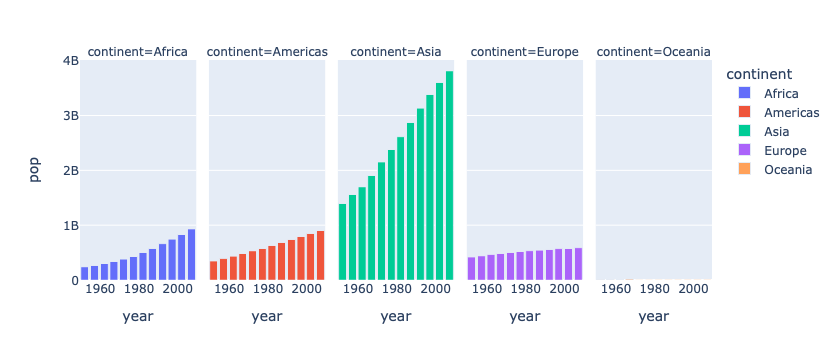

In [55]:
df = df_.groupby(['year', 'continent'])['pop'].sum().reset_index()

fig = px.bar(df, x='year' , y='pop', color='continent', facet_col='continent')
fig.show()

In [42]:
df = df_.groupby(['year', 'continent']).sum().reset_index()
df.head()
df.continent.value_counts().index

'Africa'

In [57]:
df_.country.loc[df_.continent == 'Oceania'].value_counts()

Australia      12
New Zealand    12
Name: country, dtype: int64

### Adding your own style to your charts

#### 01. Own Style

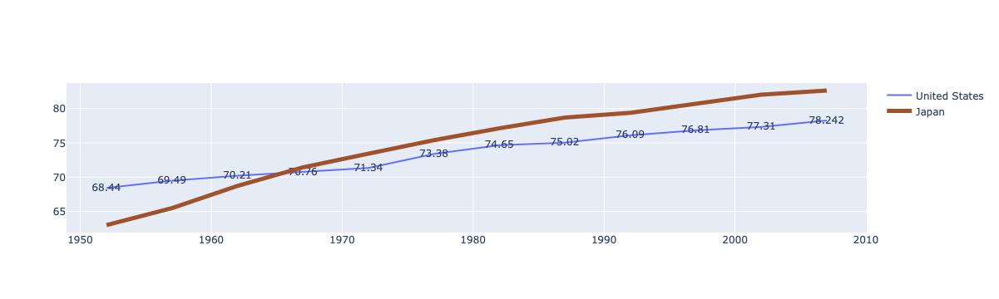

In [102]:
country1 = 'United States'
country2 = 'Japan'

fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=df_[df_.country == country1].year,
        y=df_[df_.country == country1].lifeExp,
        name=country1,
        text=df_[df_.country == country1].lifeExp,
        #marker= 'd',
        mode='lines+text',
        
    )
)
fig.add_trace(
    go.Scatter(
        x=df_[df_.country == country2].year,
        y=df_[df_.country == country2].lifeExp,
        name=country2,
        mode='lines',
        line= dict(
            color='sienna',
            width=5
        )
    )
)
fig.show()

#### 02 - Own Style

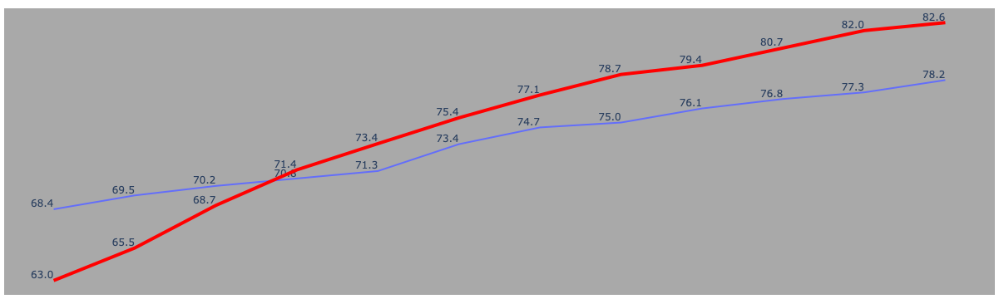

In [95]:
country1 = 'United States'
country2 = 'Japan'

fig=go.Figure()
fig.add_trace(
    go.Scatter(
        x=df_[df_.country == country1].year,
        y=df_[df_.country == country1].lifeExp,
        text=df_[df_.country == country1].lifeExp,
        name = country1,
        mode = 'lines+text',
        textposition='bottom right'
    )
)
fig.add_trace(
    go.Scatter(
        x=df_[df_.country == country2].year,
        y=df_[df_.country == country2].lifeExp,
        text=df_[df_.country == country2].lifeExp,
        name=country2,
        mode='lines+text',
        textposition='bottom right',
        line= dict(
            color='red',
            width=4
        )
    )
)

fig.update_layout(margin=dict(l=5, r=5, t=10, b=5),
                  showlegend=False,
                  plot_bgcolor='darkgray',
                  xaxis=dict(showticklabels=False,showgrid=False),
                  yaxis=dict(showticklabels=False,showgrid=False)                  
                 )
fig.update_traces(textposition='top left', texttemplate='%{text:.3s}')
fig.show()



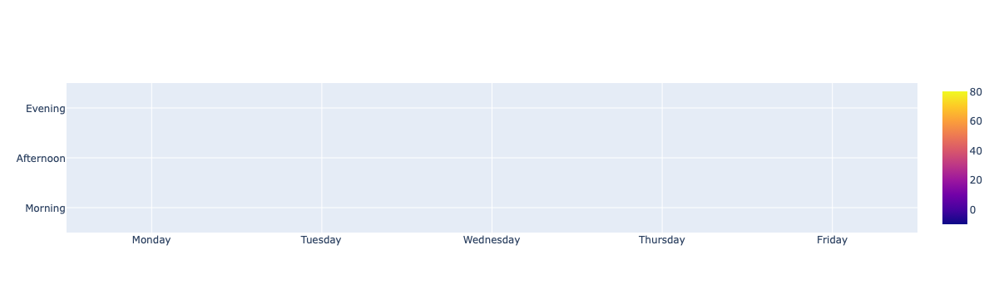

In [80]:
fig = go.Figure(data=go.Heatmap(
                   z=[[1, None, 30, 50, 1], [20, 1, 60, 80, 30], [30, 60, 1, -10, 20]],
                   x=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'],
                   y=['Morning', 'Afternoon', 'Evening'],
                   hoverongaps = False))
fig.show()